In [14]:
import tensorflow as tf
from tensorflow.keras import mixed_precision
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, Dense, Dropout, 
                                   BatchNormalization, Input, GlobalAveragePooling2D, 
                                   Concatenate, Multiply)
from tensorflow.keras.utils import Sequence
from tensorflow.keras import backend as K
import os
import cv2
import random
import numpy as np
import pandas as pd
import seaborn as sns
import albumentations as A
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

In [15]:
# === Configuration ===
config = {
    "epochs": 1,
    "is_config_batch_size_param": True,
    "batch_size": 65,
    "initial_lr": 0.001,
    "gpu_memory_limit": 48,  
    "target_size": (480, 640),
    "input_shape": (640, 480, 3),
    "origial_data_path": "Dataset/train_images",
    "train_data_path": "Dataset/train_images_balanced",
    # "csv_path": "processed_data/cleaned_imbalance_metadata_short.csv",
    "train_set_csv": "processed_data/new_balanced_train_metadata.csv",
    "val_set_csv": "processed_data/new_val_metadata.csv",
    "best_model": "Result/training6_alex_incept_SMOTE_aug/training6_alex_incept_SMOTE_aug_best_model.keras",
    "label_encoder_path": "Result/training6_alex_incept_SMOTE_aug/training6_alex_incept_SMOTE_aug_label_encoder.npy",
    "color_channel": "",
    "save_dir": "Result/training6_alex_incept_SMOTE_aug",
}

In [16]:
# === GPU Setup ===
os.environ['TF_XLA_FLAGS'] = '--tf_xla_enable_xla_devices=false'
os.environ['CUDA_VISIBLE_DEVICES'] = '0'  

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        policy = mixed_precision.Policy('float32')
        mixed_precision.set_global_policy(policy)
        
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        tf.config.optimizer.set_jit(True)
        tf.config.threading.set_intra_op_parallelism_threads(8)
        tf.config.threading.set_inter_op_parallelism_threads(4)
    except RuntimeError as e:
        print(e)

def cleanup_gpu_memory():
    """Force clear GPU memory"""
    K.clear_session()
    tf.compat.v1.reset_default_graph()
    if tf.config.list_physical_devices('GPU'):
        try:
            for gpu in tf.config.list_physical_devices('GPU'):
                tf.config.experimental.set_memory_growth(gpu, True)
        except RuntimeError:
            pass

In [17]:
# === Memory Management ===
def calculate_max_batch_size(model, input_shape, gpu_mem=24, default_batch=32, is_use_config_batch_size=config["is_config_batch_size_param"]):
    """Improved batch size calculator with error handling"""
    if is_use_config_batch_size:
        return default_batch
    try:
        params = model.count_params()
        
        last_dense = None
        for layer in reversed(model.layers):
            if isinstance(layer, tf.keras.layers.Dense):
                last_dense = layer
                if layer.name == 'features':  
                    break
        
        if last_dense is None:
            raise ValueError("No Dense layer found in model!")
        
        # Memory per sample = weights + activations (in GB)
        per_sample = (
            (params * 4) +                 
            (np.prod(input_shape) * last_dense.units * 4)  
        ) / (1024 ** 3)
        
        # Max batch size with 3GB safety margin
        max_batch = int((gpu_mem - 3) / per_sample)
        return min(256, max_batch)  
    
    except Exception as e:
        print(f"Warning: Batch size estimation failed, using default={default_batch}. Error: {e}")
        return default_batch

In [18]:
# === Data Pipeline ===
# def load_and_preprocess_data(random_state=42, save_splits=True):
#     """Load and split data with fixed random state for reproducibility"""
#     df = pd.read_csv(config["csv_path"])
    
#     le = LabelEncoder()
#     df['label_encoded'] = le.fit_transform(df['label'])
#     print(f"Label classes: {le.classes_}")
    
#     with open(config['label_encoder_path'], 'wb') as f:
#         np.save(f, le.classes_)
    
#     train_df, val_df = train_test_split(
#         df, 
#         test_size=0.2, 
#         stratify=df['label'],
#         random_state=random_state,
#     )
    
#     if save_splits:
#         train_df.to_csv(config['train_set_csv'], index=False)
#         val_df.to_csv(config['val_set_csv'], index=False)
    
#     return train_df, val_df, le

In [19]:
class DataGenerator(Sequence):
    def __init__(self, df, base_path, batch_size=32, target_size={config['target_size']}, shuffle=False, debug=False, input_config=None, is_val=False, **kwargs):
        super().__init__(**kwargs)
        self.df = df.reset_index(drop=True)
        self.base_path = base_path
        self.batch_size = batch_size
        self.target_size = target_size  
        self.shuffle = shuffle
        self.debug = debug
        self.indices = np.arange(len(df))
        self.input_config = input_config
        self.is_val = is_val
        
        self.aug = A.Compose(input_config["augmentation"])
        
        if shuffle:
            np.random.shuffle(self.indices)
            
        if self.debug:
            self.visualize_samples()    
            

    def visualize_samples(self):        
        try:
            row = self.df.iloc[0]
            img = self._load_image(row['image_id'], row['label'], 0)
            augmented = self.aug(image=img)
            
            plt.figure(figsize=(12, 6))
            
            # original
            plt.subplot(1, 2, 1)
            plt.imshow(img)
            plt.title(f"Original\nShape: {img.shape}")
            
            # augmented
            plt.subplot(1, 2, 2)
            plt.imshow(augmented['image'])
            plt.title(f"Augmented\nShape: {augmented['image'].shape}")
            
            plt.tight_layout()
            plt.show()
            
        except Exception as e:
            print(f"Visualization failed for {row['image_id']}: {str(e)}")
    
    def __len__(self):
        return int(np.ceil(len(self.df) / self.batch_size))
    
    def _load_image(self, image_id, label, row_idx):
        base_name = os.path.splitext(image_id)[0]
        
        if self.is_val:
            # Validation: use original image
            img_path = os.path.join(
                self.base_path,
                label,
                f"{base_name}.jpg"
            )
        else:
            # Training: use augmented version with row_idx
            img_path = os.path.join(
                self.base_path,
                label,
                f"{base_name}_{row_idx}.jpg"
            )
        img = cv2.imread(img_path)
        if img is None:
            raise FileNotFoundError(f"Image not found at {img_path}")
        return img
    
    def __getitem__(self, idx):
        batch_indices = self.indices[idx*self.batch_size:(idx+1)*self.batch_size]
        batch_df = self.df.iloc[batch_indices]
        
        X = np.zeros((len(batch_df), self.target_size[1], self.target_size[0], 3), dtype=np.float32) #(batch, height, width, channels)
        y = np.zeros((len(batch_df),), dtype=np.int32)
        
        for i, (row_idx, row) in enumerate(batch_df.iterrows()):
            try:
                img = self._load_image(row['image_id'], row['label'], row_idx)
                augmented = self.aug(image=img)
                X[i] = augmented['image'] / 255.0
                y[i] = row['label_encoded']
            except Exception as e:
                print(f"Error loading {row['image_id']}: {str(e)}")
                X[i] = np.zeros((self.target_size[1], self.target_size[0], 3), dtype=np.float32) #(batch, height, width, channels)
                y[i] = -1
                
        valid = y != -1
        return X[valid], y[valid]

In [20]:
# === Model Architecture ===
def se_block(input_tensor, ratio=16):
    channels = input_tensor.shape[-1]
    se = GlobalAveragePooling2D()(input_tensor)
    se = Dense(channels // ratio, activation="relu")(se)
    se = Dense(channels, activation="sigmoid")(se)
    return Multiply()([input_tensor, se])

def create_custom_alex_inception(input_shape, num_classes):    
    inputs = Input(shape=input_shape, dtype=tf.float32) 
     
    # Initial feature extraction
    x = Conv2D(96, (7,7), strides=2, activation='relu', padding='same')(inputs)
    x = BatchNormalization()(x)
    x = MaxPooling2D((3,3), strides=2)(x)
    
    x = se_block(x)
    
    # Intermediate layers
    x = Conv2D(256, (5,5), activation='relu', padding='same')(x)
    x = BatchNormalization()(x)
    x = MaxPooling2D((3,3), strides=2)(x)
    
    # Parallel paths
    branch1 = Conv2D(384, (3,3), activation='relu', padding='same')(x)
    branch2 = Conv2D(384, (3,3), dilation_rate=2, activation='relu', padding='same')(x)
    x = Concatenate()([branch1, branch2])
    
    # Final classification head
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu', name='features')(x)
    x = Dropout(0.5)(x)
    outputs = Dense(num_classes, activation='softmax', dtype=tf.float32)(x)
    
    return tf.keras.Model(inputs=inputs, outputs=outputs)


In [21]:
# === Training ===
def train(config, best_model_path):
    cleanup_gpu_memory()
    
    try:
        train_df = pd.read_csv(config["train_set_csv"])
        val_df = pd.read_csv(config["val_set_csv"])
            
        le = LabelEncoder()
        train_df['label_encoded'] = le.fit_transform(train_df['label'])
        print(f"Label classes: {le.classes_}")
        
        with open(config['label_encoder_path'], 'wb') as f:
            np.save(f, le.classes_)

        num_classes = len(le.classes_)
        print("Classes: ", num_classes)
        
        # Create the mopdel
        input_shape = config["input_shape"] 
        model = create_custom_alex_inception(input_shape, num_classes)
        
        # Find optimal batch size
        cleanup_gpu_memory()
        optimized_batch_size = calculate_max_batch_size(
                                    model, 
                                    input_shape=config["input_shape"],
                                    gpu_mem=config["gpu_memory_limit"],
                                    default_batch=config["batch_size"],
                                )
        
        print(f"\n=== Training Configuration ===")
        print(f"Batch size: {optimized_batch_size}")
        print(f"Input size: {config['target_size']}")
        print(f"Classes: {num_classes}")
        print(f"GPU Memory: {config['gpu_memory_limit']}GB\n")
        print(f"Model input shape: {model.input_shape}")
        
        train_gen = DataGenerator(
            df=train_df,
            base_path=config["train_data_path"],
            batch_size=optimized_batch_size,
            target_size=config["target_size"],
            shuffle=False,
            debug=True,
            input_config=config,
            is_val=False,
        )
        
        val_gen = DataGenerator(
            df=val_df,
            base_path=config["origial_data_path"],
            batch_size=optimized_batch_size,
            target_size=config["target_size"],
            shuffle=False,
            debug=False,
            input_config=config,
            is_val=True,
        )
        
        model.compile(
            optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )
        
        sample_batch = train_gen[0]
        print(f"Generator output shape: {sample_batch[0].shape}")
        print(f"Model input shape: {model.input_shape}")
        
        # Train
        history = model.fit(
            train_gen,
            validation_data=val_gen,
            epochs=config["epochs"],
            callbacks=[
                    tf.keras.callbacks.EarlyStopping(
                    monitor='val_accuracy',
                    patience=5,  
                    mode='max',
                    restore_best_weights=True  
                ),
                tf.keras.callbacks.ModelCheckpoint(
                    best_model_path,  
                    save_weights_only=False,
                    monitor='val_accuracy',
                    save_best_only=True
                ),
                    tf.keras.callbacks.ReduceLROnPlateau(
                    monitor='val_accuracy',
                    factor=0.5,  
                    patience=3,
                    mode='max'
                )
            ]
        )
        
        return model, history
        
    except Exception as e:
        print(f"Training failed: {e}")
        cleanup_gpu_memory()
        raise

In [22]:
def plot_accuracy_loss(history):
    """Plot accuracy and loss"""
    plt.figure(figsize=(12, 5))
    
    # Accuracy
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    
    # Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

In [23]:
def evaluate_model(config, best_model_path, use_val_set=True):
    """Deterministic evaluation with debug checks"""
    try:
        # Load model 
        with open(config['label_encoder_path'], 'rb') as f:
            classes = np.load(f, allow_pickle=True)
        le = LabelEncoder()
        le.classes_ = classes

        model = tf.keras.models.load_model(best_model_path, compile=False) 
            
        cleanup_gpu_memory()
        optimized_batch_size = calculate_max_batch_size(
                                    model, 
                                    input_shape=config["input_shape"],
                                    gpu_mem=config["gpu_memory_limit"],
                                    default_batch=config["batch_size"],
                                )
        
        model.compile(
            optimizer='adam',
            loss='sparse_categorical_crossentropy',
            metrics=[
                tf.keras.metrics.SparseCategoricalAccuracy(name='acc'),
                tf.keras.metrics.SparseTopKCategoricalAccuracy(k=3, name='top3_acc')
            ]
        )

        eval_df = pd.read_csv(config["val_set_csv"])
        print(f"Evaluating on {len(eval_df)} samples")

        eval_gen = DataGenerator(
            df=eval_df,
            base_path=config["origial_data_path"],
            batch_size=optimized_batch_size,  
            target_size=config["target_size"],
            shuffle=False,  
            debug=False,
            input_config=config,
            is_val=True,
        )

        # Inspect first batch
        x_test, y_test = eval_gen[0]
        print(f"\n[DEBUG] First batch - X shape: {x_test.shape}, y shape: {y_test.shape}")
        print(f"[DEBUG] Sample label: {y_test[0]} -> {le.classes_[y_test[0]]}")

        # Standard evaluation
        results = model.evaluate(eval_gen, verbose=1, return_dict=True)
        print("\n[METRICS] Evaluation Results:", results)

        # Collect predictions
        y_true, y_pred = [], []
        for i in range(len(eval_gen)):
            x, y = eval_gen[i]
            y_true.extend(y)
            y_pred.extend(model.predict(x, verbose=0).argmax(axis=1))
        
        # Plot confusion matrix
        plot_confusion_matrix(y_true, y_pred, le.classes_, normalize=True)
        
        print("\nClassification Report:")
        print(classification_report(y_true, y_pred, target_names=le.classes_))

        return results

    except Exception as e:
        print(f"Evaluation failed: {e}")
        raise
    
def plot_confusion_matrix(y_true, y_pred, classes, normalize=False, title=None):
    """Plot confusion matrix"""
    cm = confusion_matrix(y_true, y_pred)
    fmt = '.2f' if normalize else 'd'
    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt=fmt, xticklabels=classes, yticklabels=classes,
                cmap='Blues', cbar=False)
    plt.title(title or 'Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()


In [24]:
config_1 = {**config, "target_size": (255, 255), "input_shape": (255, 255, 3), "augmentation": [A.Resize(width=255, height=255),]}

best_model_dir_1 = os.path.join(config_1["save_dir"], "best_1.keras")
model_1, history_1 = train(config_1, best_model_dir_1)
plot_accuracy_loss(history_1)
evaluate_model(config_1, best_model_dir_1, use_val_set=True)

history_dir_1 = os.path.join(config_1["save_dir"], "history_1.csv")
history_df_1 = pd.DataFrame(history_1.history)
history_df_1.to_csv(history_dir_1, index=False)

Label classes: ['bacterial_leaf_blight' 'bacterial_leaf_streak'
 'bacterial_panicle_blight' 'blast' 'brown_spot' 'dead_heart'
 'downy_mildew' 'hispa' 'normal' 'tungro']
Classes:  10

=== Training Configuration ===
Batch size: 65
Input size: (255, 255)
Classes: 10
GPU Memory: 48GB

Model input shape: (None, 255, 255, 3)
Visualization failed for 109473.jpg: Image not found at Dataset/train_images_balanced/normal/109473_0.jpg
Error loading 109473.jpg: Image not found at Dataset/train_images_balanced/normal/109473_0.jpg
Error loading 108632.jpg: Image not found at Dataset/train_images_balanced/dead_heart/108632_1.jpg
Error loading 106808.jpg: Image not found at Dataset/train_images_balanced/blast/106808_2.jpg
Error loading 103109.jpg: Image not found at Dataset/train_images_balanced/normal/103109_3.jpg
Error loading 108717.jpg: Image not found at Dataset/train_images_balanced/normal/108717_4.jpg
Error loading 100357.jpg: Image not found at Dataset/train_images_balanced/tungro/100357_5.jpg


[ WARN:0@2780.719] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/109473_0.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2780.729] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/109473_0.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2780.729] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/108632_1.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2780.730] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/106808_2.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2780.731] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/103109_3.jpg'): can't open/read file: check file path/integrity
[ WARN:0@2780.731] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/108717_4.jpg'): can't open/read file: check file path/integrity
[ WARN:

Error loading 109414.jpg: Image not found at Dataset/train_images_balanced/dead_heart/109414_63.jpg
Error loading 100287.jpg: Image not found at Dataset/train_images_balanced/tungro/100287_64.jpg
Error loading 112777.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112777_10530.jpg
Error loading 112778.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112778_10531.jpg
Error loading 112779.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112779_10532.jpg
Error loading 112780.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112780_10533.jpg
Error loading 112781.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112781_10534.jpg
Error loading 112782.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112782_10535.jpg
Error loading 112783.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/11

[ WARN:64@2782.015] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/112777_10530.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2782.016] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/112778_10531.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2782.017] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/112779_10532.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2782.018] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/112780_10533.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2782.018] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/112781_10534.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2782.019] global loadsave.cpp:268 findDecoder imre

  1/215 [..............................] - ETA: 10:06 - loss: 0.0000e+00 - accuracy: 0.0000e+00Error loading 107757.jpg: Image not found at Dataset/train_images_balanced/hispa/107757_130.jpg
Error loading 108191.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/108191_131.jpg
Error loading 102138.jpg: Image not found at Dataset/train_images_balanced/hispa/102138_132.jpg
Error loading 105317.jpg: Image not found at Dataset/train_images_balanced/normal/105317_133.jpg
Error loading 101752.jpg: Image not found at Dataset/train_images_balanced/dead_heart/101752_134.jpg
Error loading 106480.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/106480_135.jpg
Error loading 100984.jpg: Image not found at Dataset/train_images_balanced/blast/100984_136.jpg
Error loading 109781.jpg: Image not found at Dataset/train_images_balanced/normal/109781_137.jpg
Error loading 106803.jpg: Image not found at Dataset/train_images_balanced/tungro/106803_138.jpg
Error l

[ WARN:64@2783.700] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/107757_130.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2783.701] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/108191_131.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2783.702] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/102138_132.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2783.703] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/105317_133.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2783.703] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/101752_134.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2783.704] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/106480_135.jpg'): can't open/rea

Error loading 113222.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113222_10975.jpg
Error loading 113223.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113223_10976.jpg
Error loading 113224.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113224_10977.jpg
Error loading 113225.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113225_10978.jpg
Error loading 113226.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113226_10979.jpg
Error loading 113227.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113227_10980.jpg
Error loading 113228.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113228_10981.jpg
Error loading 113229.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113229_10982.jpg
Error loading 113230.jpg: Image not found at Dataset/train_image

[ WARN:65@2783.902] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113223_10976.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2783.903] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113224_10977.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2783.903] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113225_10978.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2783.904] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113226_10979.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2783.904] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113227_10980.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2783.905] global loadsave.cpp:268 findDecoder imre

Error loading 106198.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/106198_7207.jpg
Error loading 104544.jpg: Image not found at Dataset/train_images_balanced/normal/104544_7208.jpg
Error loading 101461.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/101461_7209.jpg
Error loading 109572.jpg: Image not found at Dataset/train_images_balanced/blast/109572_7210.jpg
Error loading 105186.jpg: Image not found at Dataset/train_images_balanced/blast/105186_7211.jpg
Error loading 109044.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/109044_7212.jpg
Error loading 109861.jpg: Image not found at Dataset/train_images_balanced/blast/109861_7213.jpg
Error loading 109242.jpg: Image not found at Dataset/train_images_balanced/dead_heart/109242_7214.jpg
Error loading 109313.jpg: Image not found at Dataset/train_images_balanced/blast/109313_7995.jpg
Error loading 107530.jpg: Image not found at Dataset/train_images_balanced/blast/107530_799

[ WARN:65@2784.103] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/106198_7207.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.104] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/104544_7208.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.104] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/101461_7209.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.105] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109572_7210.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.105] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/105186_7211.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.106] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/109044_7212.jpg'): can't ope

Error loading 108430.jpg: Image not found at Dataset/train_images_balanced/brown_spot/108430_3928.jpg
Error loading 108534.jpg: Image not found at Dataset/train_images_balanced/tungro/108534_3929.jpg
Error loading 102427.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/102427_3930.jpg
Error loading 102229.jpg: Image not found at Dataset/train_images_balanced/dead_heart/102229_3931.jpg
Error loading 104381.jpg: Image not found at Dataset/train_images_balanced/tungro/104381_3932.jpg
Error loading 109269.jpg: Image not found at Dataset/train_images_balanced/brown_spot/109269_3933.jpg
Error loading 103745.jpg: Image not found at Dataset/train_images_balanced/blast/103745_3934.jpg
Error loading 105678.jpg: Image not found at Dataset/train_images_balanced/dead_heart/105678_3935.jpg
Error loading 103615.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/103615_3936.jpg
Error loading 102918.jpg: Image not found at Dataset/train_images_balance

[ WARN:64@2784.304] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/108430_3928.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.305] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/108534_3929.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.305] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/102427_3930.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.306] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/102229_3931.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.306] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/104381_3932.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.307] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/109269_3933.jpg'): can't o

Error loading 111022.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111022_8775.jpg
Error loading 111023.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111023_8776.jpg
Error loading 111024.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111024_8777.jpg
Error loading 111025.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111025_8778.jpg
 22/215 [==>...........................] - ETA: 7s - loss: 0.0000e+00 - accuracy: 0.0000e+00Error loading 111026.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111026_8779.jpg
Error loading 111027.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111027_8780.jpg
Error loading 111028.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111028_8781.jpg
Error loading 111029.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111029_8782.jpg
Erro

[ WARN:65@2784.505] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/111022_8775.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.506] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/111023_8776.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.507] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/111024_8777.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.507] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/111025_8778.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.508] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/111026_8779.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2784.509] global loadsave.cpp:268 findDecoder imread_('Dataset/train_i

Error loading 114861.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114861_12614.jpg
Error loading 114862.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114862_12615.jpg
Error loading 114863.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114863_12616.jpg
Error loading 114864.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114864_12617.jpg
Error loading 114865.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114865_12618.jpg
Error loading 114866.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114866_12619.jpg
Error loading 114867.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114867_12620.jpg
Error loading 114868.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114868_12621.jpg
Error loading 114869.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/114869_12622.jpg
Error loading 114870.jpg: Image not found at Dataset/tr

[ WARN:64@2784.708] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/114861_12614.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.710] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/114862_12615.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.712] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/114863_12616.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.713] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/114864_12617.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.714] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/114865_12618.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.715] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/114866_12619

Error loading 102153.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/102153_317.jpg
Error loading 104158.jpg: Image not found at Dataset/train_images_balanced/blast/104158_318.jpg
Error loading 105625.jpg: Image not found at Dataset/train_images_balanced/dead_heart/105625_319.jpg
Error loading 103096.jpg: Image not found at Dataset/train_images_balanced/blast/103096_320.jpg
Error loading 101196.jpg: Image not found at Dataset/train_images_balanced/dead_heart/101196_321.jpg
Error loading 104042.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104042_322.jpg
Error loading 104920.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104920_323.jpg
Error loading 106538.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/106538_324.jpg
Error loading 101305.jpg: Image not found at Dataset/train_images_balanced/blast/101305_2730.jpg
Error loading 101552.jpg: Image not found at Dataset/train_images_balanced/de

[ WARN:64@2784.910] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/102153_317.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.911] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/104158_318.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.912] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/105625_319.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.912] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/103096_320.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.913] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/101196_321.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2784.913] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/104042_322.jpg'): can't open/r

Error loading 107375.jpg: Image not found at Dataset/train_images_balanced/hispa/107375_218.jpg
Error loading 105221.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/105221_219.jpg
Error loading 101358.jpg: Image not found at Dataset/train_images_balanced/tungro/101358_220.jpg
Error loading 104252.jpg: Image not found at Dataset/train_images_balanced/normal/104252_221.jpg
Error loading 107241.jpg: Image not found at Dataset/train_images_balanced/hispa/107241_222.jpg
Error loading 108198.jpg: Image not found at Dataset/train_images_balanced/normal/108198_223.jpg
Error loading 105823.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/105823_224.jpg
Error loading 106688.jpg: Image not found at Dataset/train_images_balanced/normal/106688_225.jpg
Error loading 101701.jpg: Image not found at Dataset/train_images_balanced/normal/101701_226.jpg
Error loading 106766.jpg: Image not found at Dataset/train_images_balanced/hispa/106766_227.jpg
Err

[ WARN:65@2785.114] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/105221_219.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.114] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/101358_220.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.115] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/104252_221.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.115] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/107241_222.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.116] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/108198_223.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.116] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/105823_224.jpg'): can't open/

Error loading 108836.jpg: Image not found at Dataset/train_images_balanced/tungro/108836_5265.jpg
Error loading 109357.jpg: Image not found at Dataset/train_images_balanced/dead_heart/109357_5266.jpg
Error loading 110252.jpg: Image not found at Dataset/train_images_balanced/brown_spot/110252_5267.jpg
Error loading 110152.jpg: Image not found at Dataset/train_images_balanced/normal/110152_5268.jpg
 41/215 [====>.........................] - ETA: 7s - loss: 0.0000e+00 - accuracy: 0.0000e+00Error loading 103051.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/103051_5269.jpg
Error loading 101152.jpg: Image not found at Dataset/train_images_balanced/hispa/101152_5270.jpg
Error loading 107323.jpg: Image not found at Dataset/train_images_balanced/normal/107323_5271.jpg
Error loading 103712.jpg: Image not found at Dataset/train_images_balanced/dead_heart/103712_5272.jpg
Error loading 101580.jpg: Image not found at Dataset/train_images_balanced/hispa/101580_5273.jpg
E

[ WARN:64@2785.318] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/108836_5265.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.319] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/109357_5266.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.319] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/110252_5267.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.320] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/110152_5268.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.321] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/103051_5269.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.322] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/101152_5270.jpg'): can't open/r

Error loading 104276.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104276_4337.jpg
Error loading 107751.jpg: Image not found at Dataset/train_images_balanced/dead_heart/107751_4338.jpg
Error loading 105996.jpg: Image not found at Dataset/train_images_balanced/dead_heart/105996_4339.jpg
Error loading 104816.jpg: Image not found at Dataset/train_images_balanced/tungro/104816_4340.jpg
Error loading 108647.jpg: Image not found at Dataset/train_images_balanced/brown_spot/108647_4341.jpg
Error loading 107738.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/107738_4342.jpg
Error loading 104202.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/104202_4343.jpg
Error loading 102943.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/102943_4344.jpg
Error loading 104742.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104742_4345.jpg
Error loading 104667.jpg: Image not found at Dataset/train_images_ba

[ WARN:65@2785.519] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/111672_9425.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.520] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/111673_9426.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.521] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/111674_9427.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.522] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/111675_9428.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.524] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/111676_9429.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.524] global loadsave.cpp:268 findDecoder imread_('Dataset/train_i

Error loading 113782.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113782_11535.jpg
Error loading 113783.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113783_11536.jpg
Error loading 113784.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113784_11537.jpg
Error loading 113785.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113785_11538.jpg
Error loading 113786.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113786_11539.jpg
Error loading 113787.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113787_11540.jpg
Error loading 113788.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113788_11541.jpg
Error loading 113789.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113789_11542.jpg
Error loading 113790.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113790_11543.jpg
Error loading 113791.jpg: Image not found at Dataset/train_images_balance

[ WARN:65@2785.720] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113811_11564.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.721] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113812_11565.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.722] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113813_11566.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.723] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113814_11567.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.723] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113815_11568.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2785.724] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113816_11569.jpg'): can'

Error loading 107432.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/107432_3969.jpg
Error loading 107419.jpg: Image not found at Dataset/train_images_balanced/dead_heart/107419_3970.jpg
Error loading 101359.jpg: Image not found at Dataset/train_images_balanced/tungro/101359_3971.jpg
Error loading 107874.jpg: Image not found at Dataset/train_images_balanced/brown_spot/107874_3972.jpg
Error loading 105966.jpg: Image not found at Dataset/train_images_balanced/brown_spot/105966_3973.jpg
Error loading 108292.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/108292_3974.jpg
Error loading 104489.jpg: Image not found at Dataset/train_images_balanced/hispa/104489_3975.jpg
Error loading 106153.jpg: Image not found at Dataset/train_images_balanced/blast/106153_3976.jpg
Error loading 106278.jpg: Image not found at Dataset/train_images_balanced/normal/106278_3977.jpg
Error loading 104266.jpg: Image not found at Dataset/train_images_balanced/tungro/10

[ WARN:64@2785.922] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/104030_3997.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.923] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/103975_3998.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.923] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/102295_3999.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.924] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/108380_4000.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.924] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/108878_4001.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2785.925] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/109336_4002.jpg'): can'

Error loading 111006.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111006_8759.jpg
Error loading 111007.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111007_8760.jpg
Error loading 111008.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111008_8761.jpg
Error loading 111009.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111009_8762.jpg
Error loading 111010.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111010_8763.jpg
Error loading 111011.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111011_8764.jpg
Error loading 111012.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111012_8765.jpg
Error loading 111013.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/111013_8766.jpg
Error loading 111014.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight

[ WARN:65@2786.123] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/103400_7736.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.124] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/100088_7737.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.124] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/103289_7738.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.125] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/101753_7739.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.126] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/108537_7740.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.127] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/100979_7741.jpg'): can't open/read file:

Error loading 108210.jpg: Image not found at Dataset/train_images_balanced/dead_heart/108210_4209.jpg
Error loading 100903.jpg: Image not found at Dataset/train_images_balanced/blast/100903_4210.jpg
Error loading 106512.jpg: Image not found at Dataset/train_images_balanced/normal/106512_4211.jpg
Error loading 104476.jpg: Image not found at Dataset/train_images_balanced/blast/104476_4212.jpg
Error loading 108320.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/108320_4213.jpg
Error loading 104200.jpg: Image not found at Dataset/train_images_balanced/tungro/104200_4214.jpg
Error loading 102479.jpg: Image not found at Dataset/train_images_balanced/hispa/102479_4215.jpg
Error loading 109217.jpg: Image not found at Dataset/train_images_balanced/dead_heart/109217_4216.jpg
Error loading 104127.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/104127_4217.jpg
Error loading 109429.jpg: Image not found at Dataset/train_images_balanced/blast

[ WARN:65@2786.324] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/106936_6698.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.325] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/105663_6699.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.326] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/107928_6700.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.327] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109749_6701.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.327] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/108358_6702.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.328] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/107132_6703.jpg'): can't open/read file: 

Error loading 113968.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113968_11721.jpg
Error loading 113969.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113969_11722.jpg
Error loading 113970.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113970_11723.jpg
Error loading 113971.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113971_11724.jpg
Error loading 113972.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113972_11725.jpg
Error loading 113973.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113973_11726.jpg
Error loading 113974.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113974_11727.jpg
Error loading 113975.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113975_11728.jpg
Error loading 113976.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113976_11729.jpg
Error loading 113977.jpg: Image not found at Dataset/train_images_balance

[ WARN:64@2786.525] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113996_11749.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.526] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113997_11750.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.526] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113998_11751.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.527] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113999_11752.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.527] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/114000_11753.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.528] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/114001_11754.jpg'): can'

Error loading 100750.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/100750_6760.jpg
Error loading 104695.jpg: Image not found at Dataset/train_images_balanced/brown_spot/104695_6761.jpg
Error loading 105586.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/105586_6762.jpg
Error loading 101568.jpg: Image not found at Dataset/train_images_balanced/dead_heart/101568_6763.jpg
Error loading 102931.jpg: Image not found at Dataset/train_images_balanced/hispa/102931_6764.jpg
Error loading 100102.jpg: Image not found at Dataset/train_images_balanced/tungro/100102_6765.jpg
Error loading 102208.jpg: Image not found at Dataset/train_images_balanced/normal/102208_6766.jpg
Error loading 110322.jpg: Image not found at Dataset/train_images_balanced/hispa/110322_6767.jpg
Error loading 100001.jpg: Image not found at Dataset/train_images_balanced/brown_spot/100001_6768.jpg
Error loading 104324.jpg: Image not found at Dataset/train_images_balanced/bacterial

[ WARN:65@2786.727] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/103914_6781.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.727] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/104614_6782.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.728] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/108044_6783.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.729] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/102535_6784.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.729] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/101935_6785.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2786.730] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/109105_6786.jpg'): can't open/read file: check file pa

Error loading 110086.jpg: Image not found at Dataset/train_images_balanced/blast/110086_2125.jpg
Error loading 101407.jpg: Image not found at Dataset/train_images_balanced/brown_spot/101407_2126.jpg
Error loading 100625.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/100625_2127.jpg
Error loading 101197.jpg: Image not found at Dataset/train_images_balanced/normal/101197_2128.jpg
Error loading 104565.jpg: Image not found at Dataset/train_images_balanced/tungro/104565_2129.jpg
Error loading 108875.jpg: Image not found at Dataset/train_images_balanced/normal/108875_2130.jpg
Error loading 107610.jpg: Image not found at Dataset/train_images_balanced/dead_heart/107610_2131.jpg
Error loading 104644.jpg: Image not found at Dataset/train_images_balanced/normal/104644_2132.jpg
Error loading 105330.jpg: Image not found at Dataset/train_images_balanced/tungro/105330_2133.jpg
Error loading 100755.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/100755_2

[ WARN:64@2786.933] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113362_11115.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.934] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113363_11116.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.934] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113364_11117.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.935] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113365_11118.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.936] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113366_11119.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2786.936] global loadsave.cpp:268 findDecoder imre

Error loading 112753.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112753_10506.jpg
Error loading 112754.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112754_10507.jpg
Error loading 112755.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112755_10508.jpg
Error loading 112756.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112756_10509.jpg
Error loading 112757.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112757_10510.jpg
Error loading 112758.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112758_10511.jpg
Error loading 112759.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112759_10512.jpg
Error loading 112760.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/112760_10513.jpg
Error loading 112761.jpg: Image not found at Dataset/train_image

[ WARN:65@2787.135] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/100759_8126.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.136] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/103784_8127.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.137] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/102170_8128.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.138] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/104847_8129.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.138] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/110102_8130.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.139] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/100590_8131.jpg'): can't open/read file: check f

Error loading 110626.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/110626_8379.jpg
Error loading 110627.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/110627_8380.jpg
Error loading 110628.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/110628_8381.jpg
Error loading 110629.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/110629_8382.jpg
Error loading 110630.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/110630_8383.jpg
Error loading 110631.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/110631_8384.jpg
Error loading 108921.jpg: Image not found at Dataset/train_images_balanced/brown_spot/108921_1235.jpg
Error loading 102873.jpg: Image not found at Dataset/train_images_balanced/normal/102873_1236.jpg
Error loading 102235.jpg: Image not found at Dataset/train_images_balanced/blast/102235_1237.jpg
Error loading 107678.jpg:

[ WARN:65@2787.336] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/110626_8379.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.337] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/110627_8380.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.337] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/110628_8381.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.338] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/110629_8382.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.338] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/110630_8383.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.339] global loadsave.cpp:268 findDecoder imread_('Dataset/train_i

Error loading 102059.jpg: Image not found at Dataset/train_images_balanced/hispa/102059_7500.jpg
Error loading 107240.jpg: Image not found at Dataset/train_images_balanced/blast/107240_7501.jpg
Error loading 101551.jpg: Image not found at Dataset/train_images_balanced/normal/101551_7502.jpg
Error loading 101405.jpg: Image not found at Dataset/train_images_balanced/hispa/101405_7503.jpg
Error loading 105438.jpg: Image not found at Dataset/train_images_balanced/hispa/105438_7504.jpg
Error loading 107391.jpg: Image not found at Dataset/train_images_balanced/blast/107391_7505.jpg
Error loading 110106.jpg: Image not found at Dataset/train_images_balanced/blast/110106_7506.jpg
Error loading 108234.jpg: Image not found at Dataset/train_images_balanced/normal/108234_7507.jpg
Error loading 101014.jpg: Image not found at Dataset/train_images_balanced/brown_spot/101014_7508.jpg
Error loading 104347.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/104347_7509.jpg
Error l

[ WARN:64@2787.538] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/102059_7500.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2787.538] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/107240_7501.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2787.539] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/101551_7502.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2787.539] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/101405_7503.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2787.540] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/105438_7504.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2787.540] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/107391_7505.jpg'): can't open/read file: check file path/i

Error loading 102945.jpg: Image not found at Dataset/train_images_balanced/dead_heart/102945_3319.jpg
Error loading 106618.jpg: Image not found at Dataset/train_images_balanced/normal/106618_3320.jpg
Error loading 105335.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/105335_3321.jpg
Error loading 103925.jpg: Image not found at Dataset/train_images_balanced/blast/103925_3322.jpg
Error loading 103371.jpg: Image not found at Dataset/train_images_balanced/hispa/103371_3323.jpg
Error loading 106363.jpg: Image not found at Dataset/train_images_balanced/normal/106363_3324.jpg
Error loading 109252.jpg: Image not found at Dataset/train_images_balanced/hispa/109252_3325.jpg
Error loading 103234.jpg: Image not found at Dataset/train_images_balanced/hispa/103234_3326.jpg
Error loading 100322.jpg: Image not found at Dataset/train_images_balanced/normal/100322_3327.jpg
Error loading 102784.jpg: Image not found at Dataset/train_images_balanced/hispa/102784_3328.jpg
Err

[ WARN:65@2787.739] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/107670_3332.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.741] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/100214_3333.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.741] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/102426_3334.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.742] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/104703_3335.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.744] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/107703_3336.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.744] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/105487_3337.jpg'): can't op

Error loading 105467.jpg: Image not found at Dataset/train_images_balanced/blast/105467_7086.jpg
Error loading 103260.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/103260_7087.jpg
Error loading 103880.jpg: Image not found at Dataset/train_images_balanced/normal/103880_7088.jpg
103/215 [=============>................] - ETA: 4s - loss: 0.0000e+00 - accuracy: 0.0000e+00Error loading 105471.jpg: Image not found at Dataset/train_images_balanced/tungro/105471_7089.jpg
Error loading 101011.jpg: Image not found at Dataset/train_images_balanced/brown_spot/101011_7090.jpg
Error loading 101280.jpg: Image not found at Dataset/train_images_balanced/brown_spot/101280_7091.jpg
Error loading 106811.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/106811_7092.jpg
Error loading 107237.jpg: Image not found at Dataset/train_images_balanced/blast/107237_7093.jpg
Error loading 107282.jpg: Image not found at Dataset/train_images_balanced/blast/107282_7094.jpg


[ WARN:65@2787.941] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/105467_7086.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.942] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/103260_7087.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.943] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/103880_7088.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.944] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/105471_7089.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.945] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/101011_7090.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2787.945] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/101280_7091.jpg'): can't open/read file:

Error loading 113140.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113140_10893.jpg
Error loading 113141.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113141_10894.jpg
Error loading 113142.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113142_10895.jpg
Error loading 113143.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113143_10896.jpg
Error loading 113144.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113144_10897.jpg
Error loading 113145.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113145_10898.jpg
Error loading 113146.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113146_10899.jpg
Error loading 113147.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113147_10900.jpg
Error loading 113148.jpg: Image not found at Dataset/train_image

[ WARN:64@2788.142] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113140_10893.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.143] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113141_10894.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.144] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113142_10895.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.144] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113143_10896.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.145] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113144_10897.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.146] global loadsave.cpp:268 findDecoder imre

Error loading 108122.jpg: Image not found at Dataset/train_images_balanced/hispa/108122_5350.jpg
Error loading 105952.jpg: Image not found at Dataset/train_images_balanced/brown_spot/105952_5351.jpg
Error loading 105207.jpg: Image not found at Dataset/train_images_balanced/brown_spot/105207_5352.jpg
Error loading 101042.jpg: Image not found at Dataset/train_images_balanced/blast/101042_5353.jpg
Error loading 104046.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104046_5354.jpg
Error loading 107502.jpg: Image not found at Dataset/train_images_balanced/tungro/107502_5355.jpg
Error loading 102261.jpg: Image not found at Dataset/train_images_balanced/hispa/102261_5356.jpg
Error loading 104220.jpg: Image not found at Dataset/train_images_balanced/tungro/104220_5357.jpg
Error loading 106884.jpg: Image not found at Dataset/train_images_balanced/tungro/106884_5358.jpg
Error loading 109836.jpg: Image not found at Dataset/train_images_balanced/normal/109836_5359.jpg
Error loadi

[ WARN:65@2788.343] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/108122_5350.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.344] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/105952_5351.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.345] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/105207_5352.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.346] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/101042_5353.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.346] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/104046_5354.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.347] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/107502_5355.jpg'): can't open/read file: ch

Error loading 101292.jpg: Image not found at Dataset/train_images_balanced/blast/101292_8081.jpg
Error loading 108850.jpg: Image not found at Dataset/train_images_balanced/normal/108850_8082.jpg
Error loading 101186.jpg: Image not found at Dataset/train_images_balanced/blast/101186_8083.jpg
Error loading 101142.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/101142_8084.jpg
Error loading 107260.jpg: Image not found at Dataset/train_images_balanced/hispa/107260_8085.jpg
Error loading 105950.jpg: Image not found at Dataset/train_images_balanced/hispa/105950_8086.jpg
Error loading 102957.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/102957_8087.jpg
Error loading 108739.jpg: Image not found at Dataset/train_images_balanced/brown_spot/108739_8088.jpg
Error loading 109952.jpg: Image not found at Dataset/train_images_balanced/normal/109952_8089.jpg
Error loading 104652.jpg: Image not found at Dataset/train_images_balanced/tungro/104652_8090.jpg

[ WARN:65@2788.545] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/101292_8081.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.546] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/108850_8082.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.546] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/101186_8083.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.547] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/101142_8084.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.548] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/107260_8085.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.548] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/105950_8086.jpg'): can't open/read file: check file

Error loading 104475.jpg: Image not found at Dataset/train_images_balanced/blast/104475_7801.jpg
Error loading 106539.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/106539_7802.jpg
Error loading 100004.jpg: Image not found at Dataset/train_images_balanced/blast/100004_7803.jpg
Error loading 100665.jpg: Image not found at Dataset/train_images_balanced/dead_heart/100665_7804.jpg
Error loading 108896.jpg: Image not found at Dataset/train_images_balanced/dead_heart/108896_7805.jpg
Error loading 109539.jpg: Image not found at Dataset/train_images_balanced/brown_spot/109539_7806.jpg
Error loading 106845.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/106845_7807.jpg
Error loading 104634.jpg: Image not found at Dataset/train_images_balanced/normal/104634_7808.jpg
Error loading 104872.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/104872_7809.jpg
Error loading 104481.jpg: Image not found at Dataset/train_images_balanc

[ WARN:64@2788.748] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/104475_7801.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.749] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/106539_7802.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.749] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/100004_7803.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.750] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/100665_7804.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.750] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/108896_7805.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2788.751] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/109539_7806.jpg'): can't ope

Error loading 105772.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/105772_2265.jpg
Error loading 106434.jpg: Image not found at Dataset/train_images_balanced/dead_heart/106434_2266.jpg
Error loading 105675.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/105675_2267.jpg
Error loading 108631.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/108631_2268.jpg
Error loading 108795.jpg: Image not found at Dataset/train_images_balanced/blast/108795_2269.jpg
Error loading 105086.jpg: Image not found at Dataset/train_images_balanced/dead_heart/105086_2270.jpg
Error loading 109404.jpg: Image not found at Dataset/train_images_balanced/tungro/109404_2271.jpg
Error loading 108137.jpg: Image not found at Dataset/train_images_balanced/blast/108137_2272.jpg
Error loading 110042.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/110042_2273.jpg
Error loading 109163.jpg: Image not found at Dataset/train_im

[ WARN:65@2788.949] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/105772_2265.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.950] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/106434_2266.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.951] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/105675_2267.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.951] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/108631_2268.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.952] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/108795_2269.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2788.953] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/1

Error loading 105982.jpg: Image not found at Dataset/train_images_balanced/tungro/105982_949.jpg
Error loading 110129.jpg: Image not found at Dataset/train_images_balanced/tungro/110129_950.jpg
Error loading 106410.jpg: Image not found at Dataset/train_images_balanced/normal/106410_951.jpg
Error loading 105283.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/105283_952.jpg
Error loading 106829.jpg: Image not found at Dataset/train_images_balanced/dead_heart/106829_953.jpg
Error loading 100089.jpg: Image not found at Dataset/train_images_balanced/dead_heart/100089_954.jpg
Error loading 106637.jpg: Image not found at Dataset/train_images_balanced/blast/106637_955.jpg
Error loading 107348.jpg: Image not found at Dataset/train_images_balanced/dead_heart/107348_956.jpg
Error loading 103873.jpg: Image not found at Dataset/train_images_balanced/dead_heart/103873_957.jpg
Error loading 109345.jpg: Image not found at Dataset/train_images_balanced/tungro/109345_958.jpg
Error loa

[ WARN:64@2789.151] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/105982_949.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.152] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/110129_950.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.153] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/106410_951.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.154] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/105283_952.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.155] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/106829_953.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.156] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/100089_954.jpg'): can't open/read file: chec

Error loading 103550.jpg: Image not found at Dataset/train_images_balanced/blast/103550_7678.jpg
Error loading 108151.jpg: Image not found at Dataset/train_images_balanced/blast/108151_7679.jpg
Error loading 103532.jpg: Image not found at Dataset/train_images_balanced/blast/103532_7680.jpg
Error loading 102148.jpg: Image not found at Dataset/train_images_balanced/blast/102148_7681.jpg
Error loading 104698.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104698_7682.jpg
Error loading 100110.jpg: Image not found at Dataset/train_images_balanced/normal/100110_7683.jpg
Error loading 102327.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/102327_7684.jpg
Error loading 106700.jpg: Image not found at Dataset/train_images_balanced/normal/106700_7685.jpg
Error loading 108270.jpg: Image not found at Dataset/train_images_balanced/dead_heart/108270_7686.jpg
Error loading 106653.jpg: Image not found at Dataset/train_images_balanced/blast/106653_7687.jpg
Error loadi

[ WARN:64@2789.354] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/101567_7706.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.355] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/105417_7707.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.356] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/104594_7708.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.356] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/105531_7709.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.357] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/104085_7710.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.357] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/102863_7711.jpg'): can't open/read file: check file path/

Error loading 105131.jpg: Image not found at Dataset/train_images_balanced/blast/105131_2837.jpg
Error loading 101046.jpg: Image not found at Dataset/train_images_balanced/tungro/101046_2838.jpg
Error loading 105693.jpg: Image not found at Dataset/train_images_balanced/normal/105693_2839.jpg
Error loading 104113.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104113_2840.jpg
Error loading 104462.jpg: Image not found at Dataset/train_images_balanced/normal/104462_2841.jpg
Error loading 103802.jpg: Image not found at Dataset/train_images_balanced/dead_heart/103802_2842.jpg
Error loading 101404.jpg: Image not found at Dataset/train_images_balanced/hispa/101404_2843.jpg
Error loading 100185.jpg: Image not found at Dataset/train_images_balanced/brown_spot/100185_2844.jpg
Error loading 105707.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/105707_2845.jpg
Error loading 109188.jpg: Image not found at Dataset/train_images_balanced/blast/109188_2846.

[ WARN:65@2789.557] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/100471_1170.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2789.558] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/108339_1171.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2789.558] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/102622_1172.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2789.559] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/102653_1173.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2789.559] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/103310_1174.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2789.561] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/104807_1175.jpg'): can't open/read file: check file pat

Error loading 105852.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/105852_6154.jpg
Error loading 108308.jpg: Image not found at Dataset/train_images_balanced/hispa/108308_6155.jpg
Error loading 104055.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/104055_6156.jpg
Error loading 109075.jpg: Image not found at Dataset/train_images_balanced/blast/109075_6157.jpg
Error loading 108118.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/108118_6158.jpg
Error loading 100298.jpg: Image not found at Dataset/train_images_balanced/normal/100298_6159.jpg
Error loading 100229.jpg: Image not found at Dataset/train_images_balanced/brown_spot/100229_6160.jpg
Error loading 101963.jpg: Image not found at Dataset/train_images_balanced/dead_heart/101963_6161.jpg
Error loading 107740.jpg: Image not found at Dataset/train_images_balanced/brown_spot/107740_6162.jpg
Error loading 102536.jpg: Image not found at Dataset/train_images_balanc

[ WARN:64@2789.758] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/105852_6154.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.759] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/108308_6155.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.760] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/104055_6156.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.760] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109075_6157.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.761] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/108118_6158.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.761] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/100298_6159.jpg'): 

Error loading 113695.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113695_11448.jpg
Error loading 113696.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113696_11449.jpg
Error loading 113697.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113697_11450.jpg
Error loading 113698.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113698_11451.jpg
Error loading 113699.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113699_11452.jpg
Error loading 113700.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113700_11453.jpg
Error loading 113701.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113701_11454.jpg
Error loading 113702.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113702_11455.jpg
Error loading 113703.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113703_11456.jpg
Error loading 113704.jpg: Image not found at Dataset/train_images_balance

[ WARN:64@2789.961] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113733_11486.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.962] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113734_11487.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.962] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113735_11488.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.963] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113736_11489.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.964] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113737_11490.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2789.964] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113738_11491.jpg'): can'

Error loading 104863.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/104863_3776.jpg
Error loading 102785.jpg: Image not found at Dataset/train_images_balanced/normal/102785_3777.jpg
Error loading 101658.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/101658_3778.jpg
Error loading 102312.jpg: Image not found at Dataset/train_images_balanced/dead_heart/102312_3779.jpg
Error loading 108165.jpg: Image not found at Dataset/train_images_balanced/tungro/108165_3780.jpg
Error loading 108987.jpg: Image not found at Dataset/train_images_balanced/blast/108987_3781.jpg
Error loading 104750.jpg: Image not found at Dataset/train_images_balanced/brown_spot/104750_3782.jpg
Error loading 104996.jpg: Image not found at Dataset/train_images_balanced/hispa/104996_3783.jpg
Error loading 102790.jpg: Image not found at Dataset/train_images_balanced/tungro/102790_3784.jpg
Error loading 101663.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/101

[ WARN:65@2790.164] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/104947_3796.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.164] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/103444_3797.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.165] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/104793_3798.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.165] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/107346_3799.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.166] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/102567_3800.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.166] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/101016_3801.jpg'): can't open/read file: check file p

Error loading 108935.jpg: Image not found at Dataset/train_images_balanced/normal/108935_5986.jpg
Error loading 106383.jpg: Image not found at Dataset/train_images_balanced/blast/106383_5987.jpg
Error loading 108542.jpg: Image not found at Dataset/train_images_balanced/tungro/108542_5988.jpg
Error loading 106354.jpg: Image not found at Dataset/train_images_balanced/blast/106354_5989.jpg
Error loading 109723.jpg: Image not found at Dataset/train_images_balanced/tungro/109723_5990.jpg
Error loading 104568.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/104568_5991.jpg
Error loading 109276.jpg: Image not found at Dataset/train_images_balanced/hispa/109276_5992.jpg
Error loading 100399.jpg: Image not found at Dataset/train_images_balanced/hispa/100399_5993.jpg
Error loading 107818.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/107818_5994.jpg
Error loading 104790.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/104790_5995.jpg
Error 

[ WARN:65@2790.365] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/107488_6006.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.366] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/103986_6007.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.367] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/103553_6008.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.367] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/104914_6009.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.368] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/108005_6010.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.368] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109717_6011.jpg'): can't open/read fi

Error loading 104221.jpg: Image not found at Dataset/train_images_balanced/hispa/104221_1305.jpg
Error loading 108748.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/108748_1306.jpg
Error loading 104922.jpg: Image not found at Dataset/train_images_balanced/tungro/104922_1307.jpg
Error loading 101954.jpg: Image not found at Dataset/train_images_balanced/normal/101954_1308.jpg
Error loading 104351.jpg: Image not found at Dataset/train_images_balanced/blast/104351_1309.jpg
Error loading 110144.jpg: Image not found at Dataset/train_images_balanced/brown_spot/110144_1310.jpg
Error loading 108276.jpg: Image not found at Dataset/train_images_balanced/dead_heart/108276_1311.jpg
Error loading 104425.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104425_1312.jpg
Error loading 108160.jpg: Image not found at Dataset/train_images_balanced/normal/108160_1313.jpg
Error loading 104103.jpg: Image not found at Dataset/train_images_balanced/normal/104103_1314

[ WARN:65@2790.568] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/107303_1324.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.568] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/102071_1325.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.569] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/109500_1326.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.569] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/103999_1327.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.570] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/105933_1328.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.570] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109475_1329.jpg'): can't 

Error loading 103342.jpg: Image not found at Dataset/train_images_balanced/brown_spot/103342_716.jpg
Error loading 101165.jpg: Image not found at Dataset/train_images_balanced/dead_heart/101165_717.jpg
Error loading 106277.jpg: Image not found at Dataset/train_images_balanced/tungro/106277_718.jpg
Error loading 110320.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/110320_719.jpg
Error loading 102176.jpg: Image not found at Dataset/train_images_balanced/hispa/102176_720.jpg
Error loading 104808.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/104808_721.jpg
Error loading 102520.jpg: Image not found at Dataset/train_images_balanced/dead_heart/102520_722.jpg
Error loading 108720.jpg: Image not found at Dataset/train_images_balanced/dead_heart/108720_723.jpg
Error loading 103150.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/103150_724.jpg
Error loading 109152.jpg: Image not found at Dataset/train_image

[ WARN:65@2790.769] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/109113_736.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.770] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/106967_737.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.770] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/105972_738.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.771] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/100397_739.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.771] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/106636_740.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2790.772] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/103579_741.jpg'): can't open/rea

Error loading 104000.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/104000_5966.jpg
Error loading 104980.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/104980_5967.jpg
Error loading 102060.jpg: Image not found at Dataset/train_images_balanced/brown_spot/102060_5968.jpg
Error loading 107743.jpg: Image not found at Dataset/train_images_balanced/hispa/107743_5969.jpg
Error loading 106875.jpg: Image not found at Dataset/train_images_balanced/tungro/106875_5970.jpg
Error loading 108325.jpg: Image not found at Dataset/train_images_balanced/normal/108325_5971.jpg
Error loading 109670.jpg: Image not found at Dataset/train_images_balanced/blast/109670_5972.jpg
Error loading 102628.jpg: Image not found at Dataset/train_images_balanced/hispa/102628_5973.jpg
Error loading 107330.jpg: Image not found at Dataset/train_images_balanced/blast/107330_5974.jpg
Error loading 110233.jpg: Image not found at Dataset/train_images_balanced/dead_heart/110233_5

[ WARN:64@2790.970] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109991_1561.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2790.971] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/102223_1562.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2790.972] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/103344_1563.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2790.972] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/106962_1564.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2790.973] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/105196_1565.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2790.974] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109934_1566.jpg'): can't open/read fil

Error loading 109712.jpg: Image not found at Dataset/train_images_balanced/hispa/109712_5625.jpg
Error loading 102568.jpg: Image not found at Dataset/train_images_balanced/hispa/102568_5626.jpg
Error loading 101413.jpg: Image not found at Dataset/train_images_balanced/blast/101413_5627.jpg
Error loading 109608.jpg: Image not found at Dataset/train_images_balanced/blast/109608_5628.jpg
Error loading 101627.jpg: Image not found at Dataset/train_images_balanced/dead_heart/101627_5629.jpg
Error loading 103106.jpg: Image not found at Dataset/train_images_balanced/tungro/103106_5630.jpg
Error loading 107620.jpg: Image not found at Dataset/train_images_balanced/hispa/107620_5631.jpg
Error loading 106798.jpg: Image not found at Dataset/train_images_balanced/normal/106798_5632.jpg
Error loading 109946.jpg: Image not found at Dataset/train_images_balanced/dead_heart/109946_5633.jpg
Error loading 104005.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/104005_5634.jpg
Er

[ WARN:65@2791.173] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/107534_5645.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.174] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/109173_5646.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.174] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/101325_5647.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.175] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/108667_5648.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.175] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/102010_5649.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.176] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/108861_5650.jpg'): can't

Error loading 113818.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113818_11571.jpg
Error loading 113819.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113819_11572.jpg
Error loading 113820.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113820_11573.jpg
Error loading 113821.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113821_11574.jpg
Error loading 113822.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113822_11575.jpg
Error loading 113823.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113823_11576.jpg
Error loading 113824.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113824_11577.jpg
Error loading 113825.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113825_11578.jpg
Error loading 113826.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113826_11579.jpg
Error loading 113827.jpg: Image not found at Dataset/train_images_balance

[ WARN:64@2791.375] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113838_11591.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.376] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113839_11592.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.376] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113840_11593.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.377] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113841_11594.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.378] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113842_11595.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.379] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113843_11596.jpg'): can'

Error loading 107827.jpg: Image not found at Dataset/train_images_balanced/dead_heart/107827_7419.jpg
Error loading 105539.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/105539_7420.jpg
Error loading 104209.jpg: Image not found at Dataset/train_images_balanced/dead_heart/104209_7421.jpg
Error loading 101709.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/101709_7422.jpg
Error loading 103272.jpg: Image not found at Dataset/train_images_balanced/blast/103272_7423.jpg
Error loading 103497.jpg: Image not found at Dataset/train_images_balanced/tungro/103497_7424.jpg
Error loading 110052.jpg: Image not found at Dataset/train_images_balanced/tungro/110052_7425.jpg
Error loading 109059.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/109059_7426.jpg
Error loading 106359.jpg: Image not found at Dataset/train_images_balanced/tungro/106359_7427.jpg
Error loading 103432.jpg: Image not found at Dataset/train_images_balanced/blast/103

[ WARN:64@2791.576] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/107827_7419.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.577] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/downy_mildew/105539_7420.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.577] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/104209_7421.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.578] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/101709_7422.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.578] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/103272_7423.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.579] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/103497_7424.jpg'): can't 

Error loading 113941.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113941_11694.jpg
Error loading 113942.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113942_11695.jpg
Error loading 113943.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113943_11696.jpg
Error loading 113944.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113944_11697.jpg
Error loading 113945.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113945_11698.jpg
Error loading 113946.jpg: Image not found at Dataset/train_images_balanced/brown_spot/113946_11699.jpg
Error loading 113037.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113037_10790.jpg
Error loading 113038.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113038_10791.jpg
Error loading 113039.jpg: Image not found at Dataset/train_images_balanced/bacterial_panicle_blight/113039_10792.jpg
Error loading 113040.jpg: Image

[ WARN:65@2791.778] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113942_11695.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.778] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113943_11696.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.779] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113944_11697.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.779] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113945_11698.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.780] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/113946_11699.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2791.785] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_panicle_blight/113037_107

Error loading 109662.jpg: Image not found at Dataset/train_images_balanced/tungro/109662_426.jpg
Error loading 104887.jpg: Image not found at Dataset/train_images_balanced/brown_spot/104887_427.jpg
Error loading 104557.jpg: Image not found at Dataset/train_images_balanced/hispa/104557_428.jpg
Error loading 105591.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_streak/105591_429.jpg
Error loading 104837.jpg: Image not found at Dataset/train_images_balanced/blast/104837_430.jpg
Error loading 101289.jpg: Image not found at Dataset/train_images_balanced/normal/101289_431.jpg
Error loading 104986.jpg: Image not found at Dataset/train_images_balanced/hispa/104986_432.jpg
Error loading 101609.jpg: Image not found at Dataset/train_images_balanced/brown_spot/101609_433.jpg
Error loading 107718.jpg: Image not found at Dataset/train_images_balanced/dead_heart/107718_434.jpg
Error loading 110034.jpg: Image not found at Dataset/train_images_balanced/brown_spot/110034_435.jpg
Er

[ WARN:64@2791.979] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/109662_426.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.979] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/104887_427.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.980] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/104557_428.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.980] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_streak/105591_429.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.981] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/104837_430.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2791.982] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/101289_431.jpg'): can't open/read file: c

Error loading 101475.jpg: Image not found at Dataset/train_images_balanced/blast/101475_1536.jpg
Error loading 109903.jpg: Image not found at Dataset/train_images_balanced/blast/109903_1537.jpg
Error loading 106194.jpg: Image not found at Dataset/train_images_balanced/normal/106194_1538.jpg
Error loading 100113.jpg: Image not found at Dataset/train_images_balanced/tungro/100113_1539.jpg
Error loading 106986.jpg: Image not found at Dataset/train_images_balanced/tungro/106986_1540.jpg
Error loading 108574.jpg: Image not found at Dataset/train_images_balanced/hispa/108574_1541.jpg
Error loading 103161.jpg: Image not found at Dataset/train_images_balanced/blast/103161_1542.jpg
Error loading 104781.jpg: Image not found at Dataset/train_images_balanced/blast/104781_1543.jpg
Error loading 100841.jpg: Image not found at Dataset/train_images_balanced/blast/100841_1544.jpg
Error loading 102909.jpg: Image not found at Dataset/train_images_balanced/blast/102909_1545.jpg
Error loading 106681.jpg: I

[ WARN:64@2792.180] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/101475_1536.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.181] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/blast/109903_1537.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.182] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/106194_1538.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.182] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/100113_1539.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.183] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/106986_1540.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.183] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/108574_1541.jpg'): can't open/read file: check file path

Error loading 101318.jpg: Image not found at Dataset/train_images_balanced/brown_spot/101318_1459.jpg
Error loading 105797.jpg: Image not found at Dataset/train_images_balanced/tungro/105797_1460.jpg
Error loading 109327.jpg: Image not found at Dataset/train_images_balanced/normal/109327_1461.jpg
Error loading 106419.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/106419_1462.jpg
Error loading 107316.jpg: Image not found at Dataset/train_images_balanced/hispa/107316_1463.jpg
Error loading 102648.jpg: Image not found at Dataset/train_images_balanced/bacterial_leaf_blight/102648_1464.jpg
Error loading 109011.jpg: Image not found at Dataset/train_images_balanced/tungro/109011_1465.jpg
Error loading 106652.jpg: Image not found at Dataset/train_images_balanced/downy_mildew/106652_1466.jpg
Error loading 102635.jpg: Image not found at Dataset/train_images_balanced/hispa/102635_1467.jpg
Error loading 101055.jpg: Image not found at Dataset/train_images_balanced/norma

[ WARN:65@2792.382] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/brown_spot/101318_1459.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2792.383] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/tungro/105797_1460.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2792.383] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/normal/109327_1461.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2792.384] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/106419_1462.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2792.384] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/hispa/107316_1463.jpg'): can't open/read file: check file path/integrity
[ WARN:65@2792.385] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/bacterial_leaf_blight/102648_1464.jpg'): c

Error loading 114467.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114467_12220.jpg
Error loading 114468.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114468_12221.jpg
Error loading 114469.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114469_12222.jpg
Error loading 114470.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114470_12223.jpg
214/215 [============================>.] - ETA: 0s - loss: 0.0000e+00 - accuracy: 0.0000e+00Error loading 114471.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114471_12224.jpg
Error loading 114472.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114472_12225.jpg
Error loading 114473.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114473_12226.jpg
Error loading 114474.jpg: Image not found at Dataset/train_images_balanced/dead_heart/114474_12227.jpg
Error loading 114475.jpg: Image not found at Dataset/train_images_balanced/dead_hear

[ WARN:64@2792.582] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/114467_12220.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.584] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/114468_12221.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.585] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/114469_12222.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.585] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/114470_12223.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.586] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/114471_12224.jpg'): can't open/read file: check file path/integrity
[ WARN:64@2792.587] global loadsave.cpp:268 findDecoder imread_('Dataset/train_images_balanced/dead_heart/114472_12225.jpg'): can'

KeyboardInterrupt: 

Label classes: ['bacterial_leaf_blight' 'bacterial_leaf_streak'
 'bacterial_panicle_blight' 'blast' 'brown_spot' 'dead_heart'
 'downy_mildew' 'hispa' 'normal' 'tungro']
Classes:  10

=== Training Configuration ===
Batch size: 65
Input size: (480, 640)
Classes: 10
GPU Memory: 48GB

Model input shape: (None, 640, 480, 3)


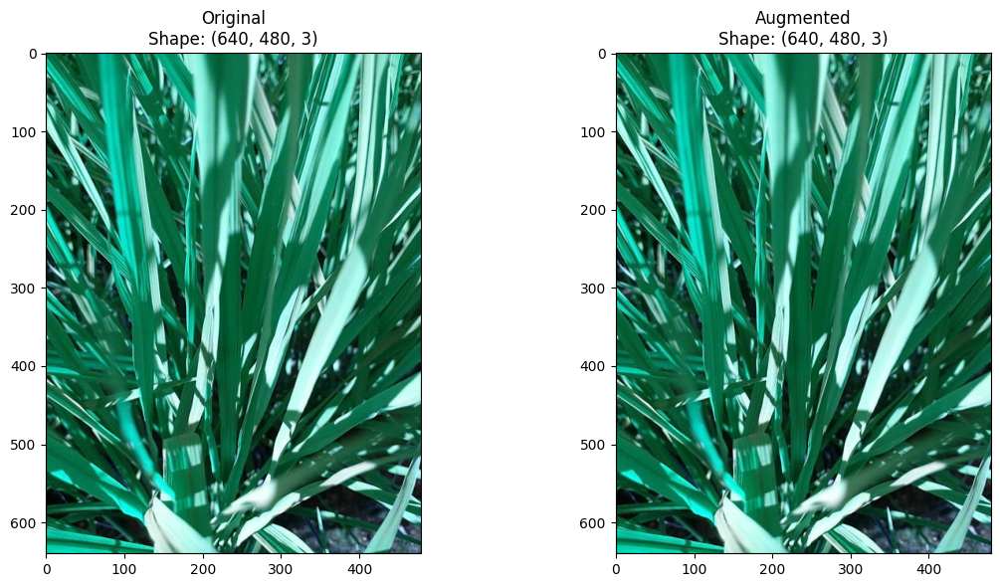

Generator output shape: (65, 640, 480, 3)
Model input shape: (None, 640, 480, 3)
Epoch 1/50


215/215 [==============================] - 238s 822ms/step - loss: 2.6138 - accuracy: 0.1063 - val_loss: 2.6395 - val_accuracy: 0.0598 - lr: 0.0010
Epoch 2/50
215/215 [==============================] - 191s 887ms/step - loss: 2.3025 - accuracy: 0.1053 - val_loss: 2.2196 - val_accuracy: 0.1676 - lr: 0.0010
Epoch 3/50
215/215 [==============================] - 163s 757ms/step - loss: 2.3222 - accuracy: 0.1102 - val_loss: 2.4322 - val_accuracy: 0.0495 - lr: 0.0010
Epoch 4/50
215/215 [==============================] - 161s 746ms/step - loss: 2.3098 - accuracy: 0.1040 - val_loss: 2.3038 - val_accuracy: 0.1127 - lr: 0.0010
Epoch 5/50
215/215 [==============================] - 166s 773ms/step - loss: 2.3032 - accuracy: 0.1116 - val_loss: 2.3224 - val_accuracy: 0.0608 - lr: 0.0010
Epoch 6/50
215/215 [==============================] - 200s 928ms/step - loss: 2.2610 - accuracy: 0.1438 - val_loss: 2.2749 - val_accuracy: 0.1352 - lr: 5.0000e-04
Epoch 7/50
215/215 [==============================] -

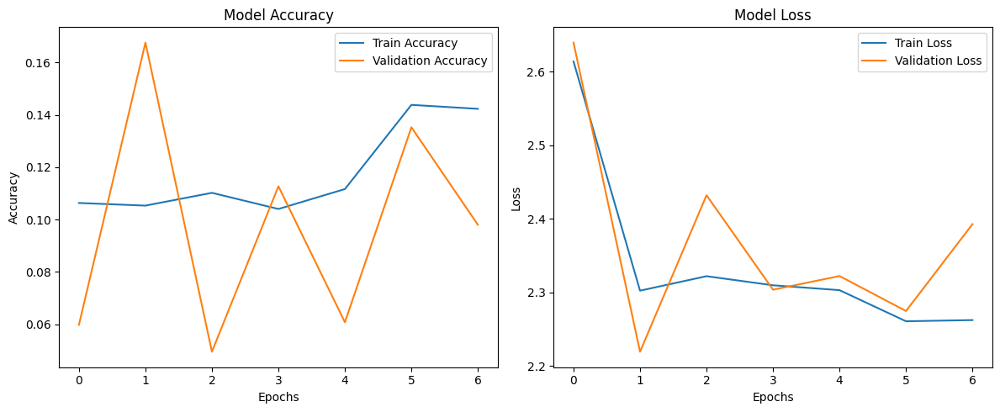

Evaluating on 2041 samples

[DEBUG] First batch - X shape: (65, 640, 480, 3), y shape: (65,)
[DEBUG] Sample label: 5 -> dead_heart
32/32 [==============================] - 25s 745ms/step - loss: 2.2196 - acc: 0.1676 - top3_acc: 0.4400

[METRICS] Evaluation Results: {'loss': 2.219550609588623, 'acc': 0.16756491363048553, 'top3_acc': 0.4399803876876831}


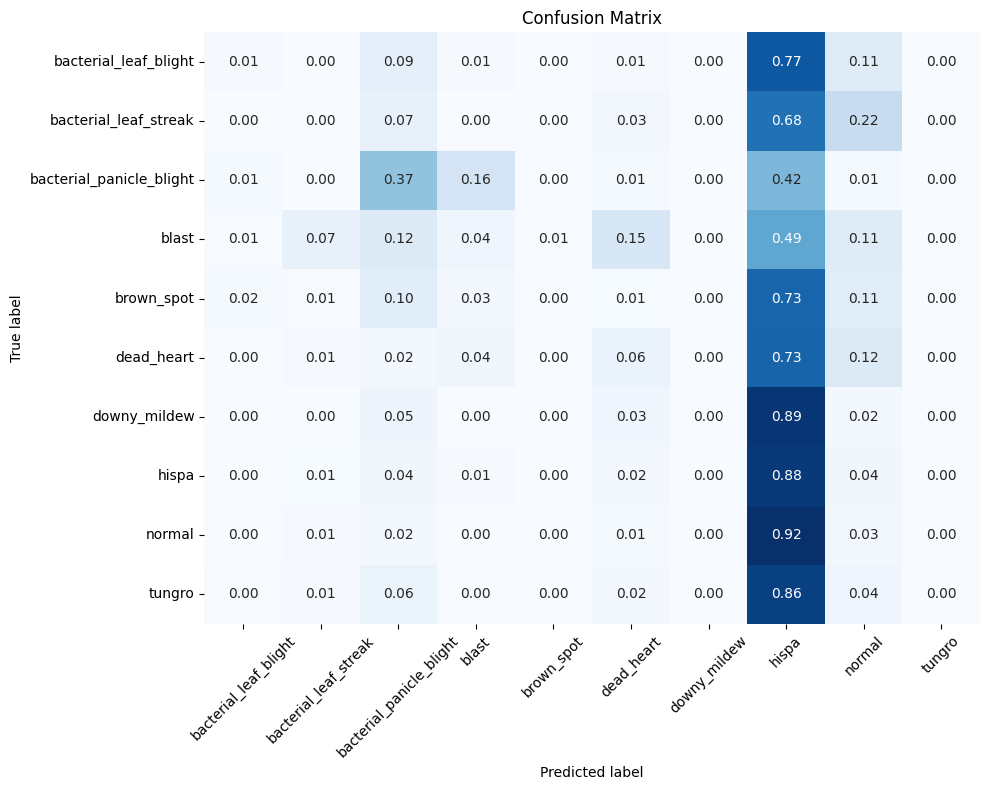


Classification Report:
                          precision    recall  f1-score   support

   bacterial_leaf_blight       0.10      0.01      0.02        93
   bacterial_leaf_streak       0.00      0.00      0.00        73
bacterial_panicle_blight       0.17      0.37      0.24        67
                   blast       0.29      0.04      0.07       341
              brown_spot       0.00      0.00      0.00       188
              dead_heart       0.19      0.06      0.10       283
            downy_mildew       0.00      0.00      0.00       122
                   hispa       0.18      0.88      0.29       311
                  normal       0.07      0.03      0.04       349
                  tungro       0.00      0.00      0.00       214

                accuracy                           0.17      2041
               macro avg       0.10      0.14      0.08      2041
            weighted avg       0.12      0.17      0.09      2041



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
config_2 = {**config, "augmentation": [A.Resize(width=480, height=640),]}

best_model_dir_2 = os.path.join(config_2["save_dir"], "best_2.keras")
model_2, history_2 = train(config_2, best_model_dir_2)
plot_accuracy_loss(history_2)
evaluate_model(config_2, best_model_dir_2, use_val_set=True)

history_dir_2 = os.path.join(config_2["save_dir"], "history_2.csv")
history_df_2 = pd.DataFrame(history_2.history)
history_df_2.to_csv(history_dir_2, index=False)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 255, 255, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 128, 128, 96)         14208     ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 128, 128, 96)         384       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 63, 63, 96)           0         ['batch_normalization[0][0

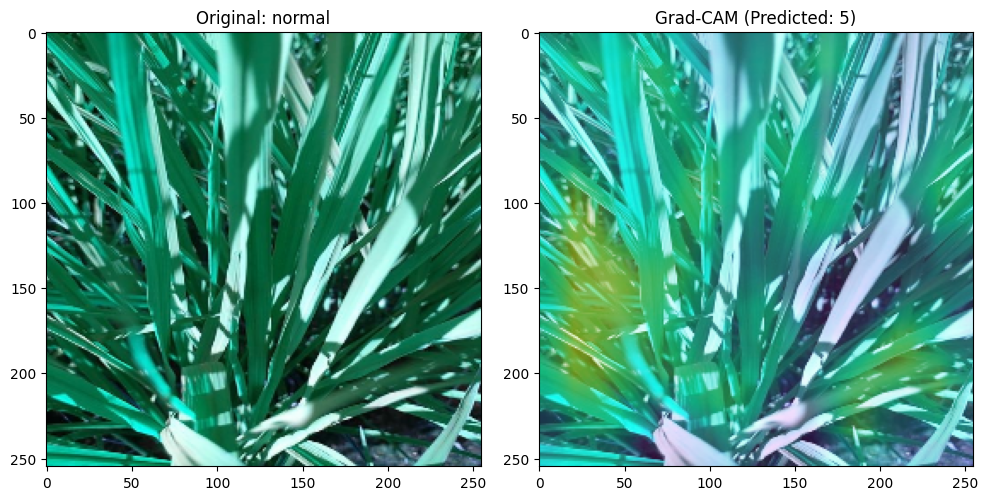

1/1 [==============================] - 0s 21ms/step


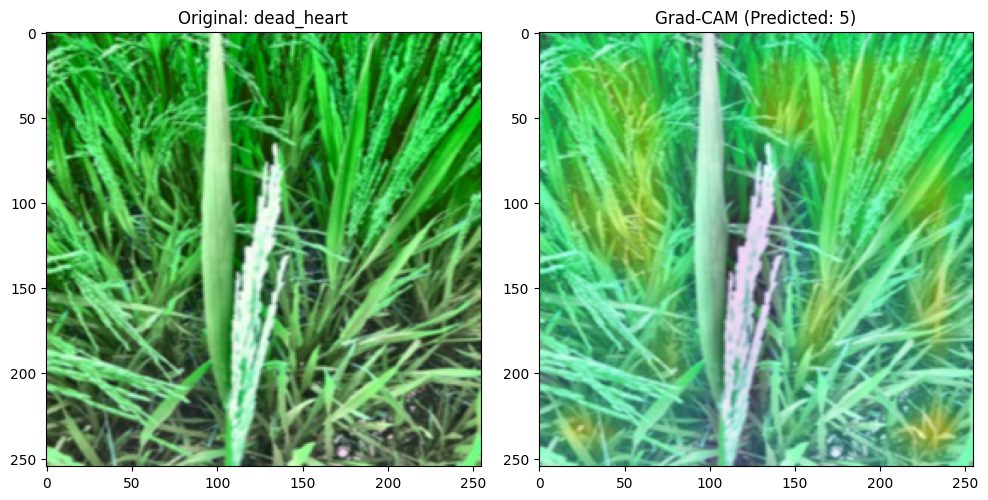

1/1 [==============================] - 0s 20ms/step


/usr/local/lib/python3.11/dist-packages/tf_explain/utils/display.py:112: RuntimeWarning: invalid value encountered in divide
  heatmap = (heatmap - np.min(heatmap)) / (heatmap.max() - heatmap.min())
/usr/local/lib/python3.11/dist-packages/tf_explain/utils/display.py:115: RuntimeWarning: invalid value encountered in cast
  cv2.cvtColor((heatmap * 255).astype("uint8"), cv2.COLOR_GRAY2BGR), colormap


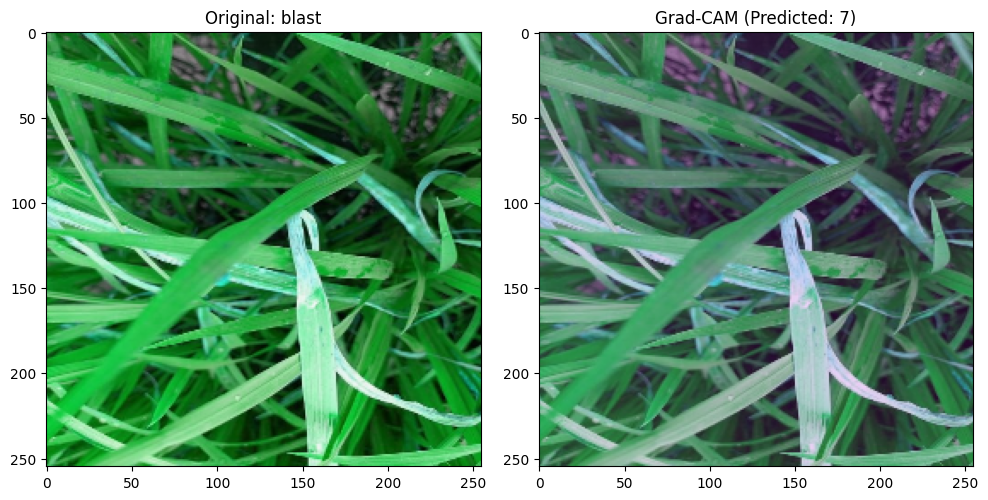

1/1 [==============================] - 0s 19ms/step


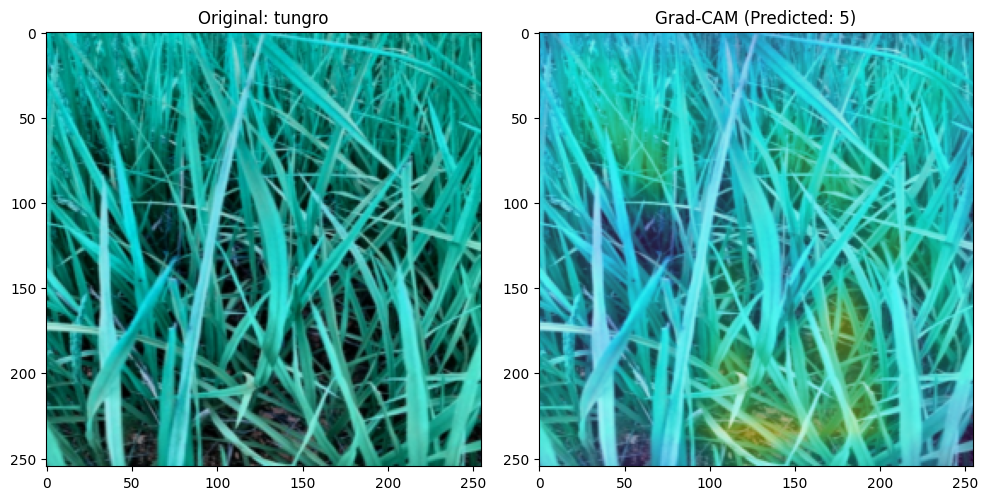

1/1 [==============================] - 0s 20ms/step


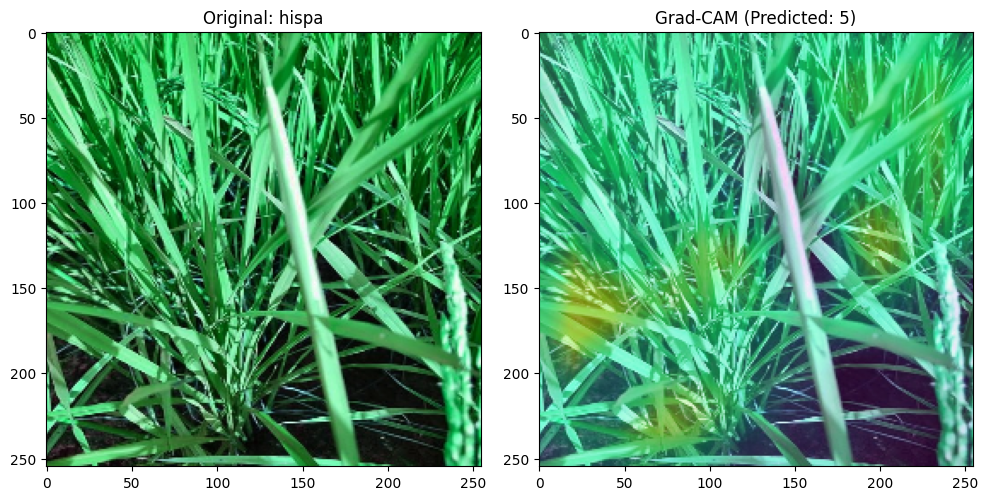

1/1 [==============================] - 0s 20ms/step


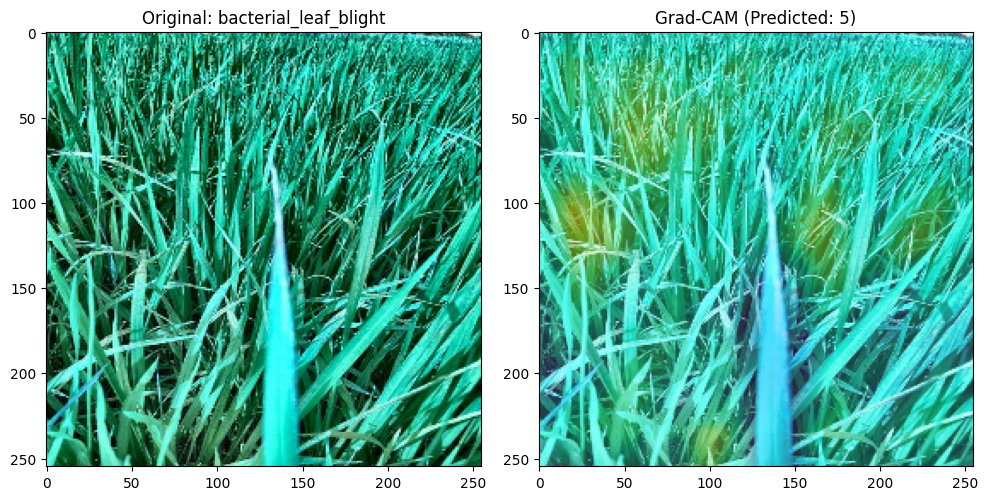

1/1 [==============================] - 0s 20ms/step


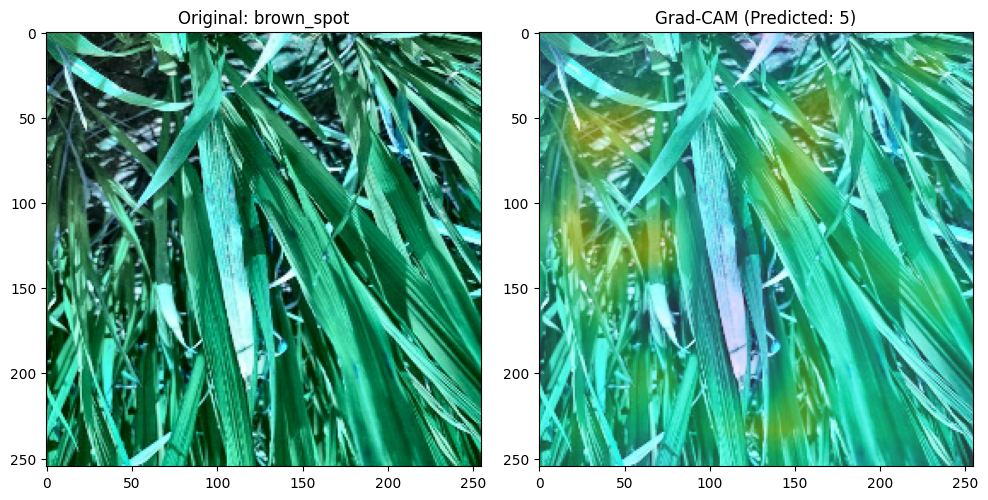

1/1 [==============================] - 0s 20ms/step


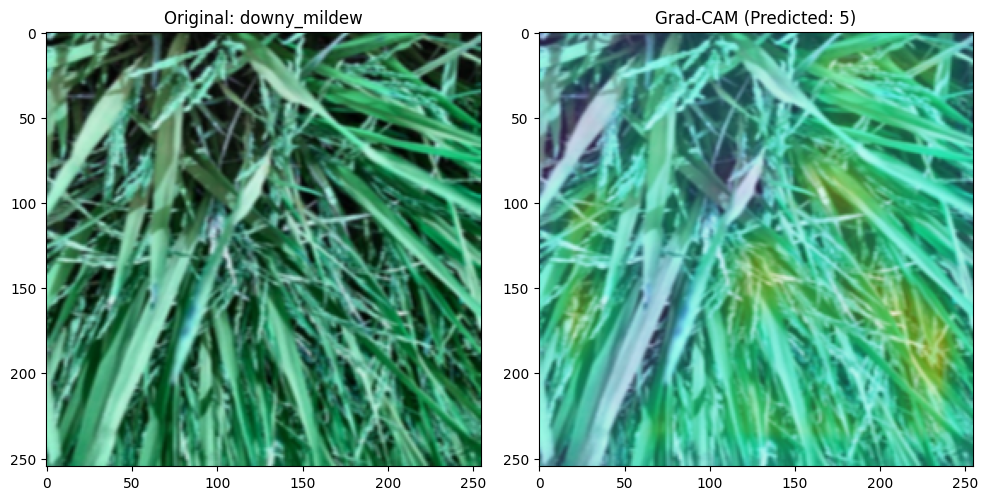

1/1 [==============================] - 0s 20ms/step


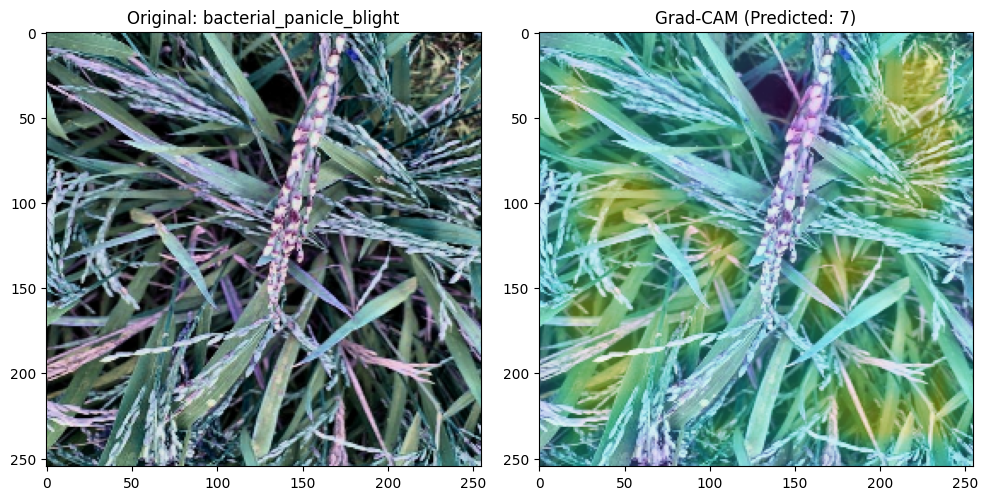

1/1 [==============================] - 0s 20ms/step


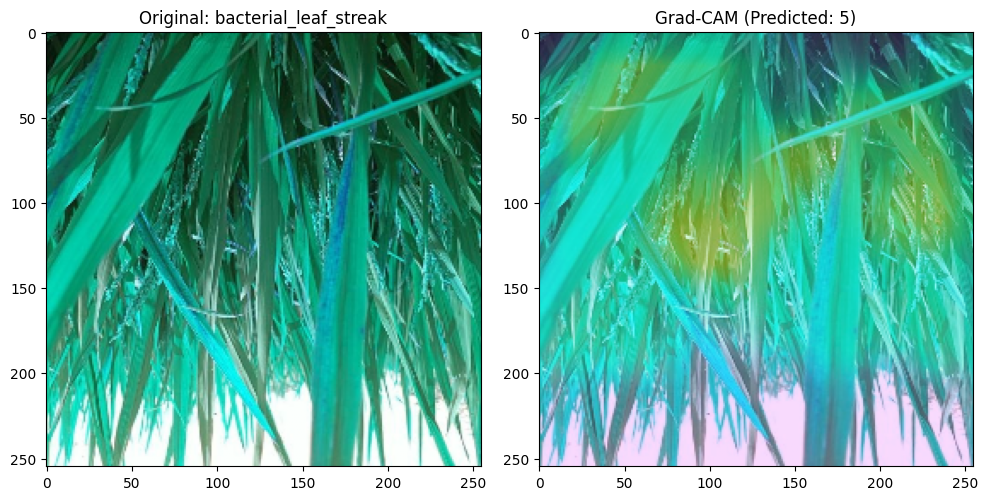

In [13]:
from glob import iglob
from tf_explain.core.grad_cam import GradCAM

def plot_attention(img, model):
    attention_model = tf.keras.Model(inputs=model.input, outputs=model.layers[4].output) 
    attention_map = attention_model.predict(img[np.newaxis, ...])[0]
    
    plt.imshow(img)
    plt.imshow(cv2.resize(attention_map.mean(axis=-1), alpha=0.5, cmap="jet"))  
    plt.show()
    
def rescale_image_square(frame,size,interpolation=cv2.INTER_AREA):
   width = int((frame.shape[1]/frame.shape[1]) * size)
   height = int((frame.shape[0]/frame.shape[0]) * size)
   dimensions = (width,height)
   return cv2.resize(frame,dimensions,interpolation)

print(model_1.summary())

def get_sample_images_per_class(base_path, target_size=(255, 255)):
    class_images = {}
    for class_name in os.listdir(base_path):
        class_dir = os.path.join(base_path, class_name)
        if os.path.isdir(class_dir):
            for file in iglob(os.path.join(class_dir, "*.jpg")):
                img = cv2.imread(file)
                if img is not None:
                    img = rescale_image_square(img, target_size[0]) / 255.0
                    class_images[class_name] = img
                    break
    return class_images

sample_images = get_sample_images_per_class(config["train_data_path"], target_size=(255, 255))

# Initialize Grad-CAM
explainer = GradCAM()

for class_name, image in sample_images.items():
    pred = model_1.predict(image[np.newaxis, ...])
    predicted_class_index = np.argmax(pred)
    
    grid = explainer.explain(
        validation_data=(image[np.newaxis, ...], None),
        model=model_1,
        layer_name="concatenate",  
        class_index=predicted_class_index
    )
    
    plt.figure(figsize=(10, 5))
    
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title(f"Original: {class_name}")
    
    plt.subplot(1, 2, 2)
    plt.imshow(image)
    plt.imshow(grid, cmap='jet', alpha=0.5)
    plt.title(f"Grad-CAM (Predicted: {predicted_class_index})")
    
    plt.tight_layout()
    plt.show()